# End-to-end Multi-class Dog Breed Classification 
## 1. Problem
We want to find out a dog breed by photo.
## 2. Data
The data we're using is from Kaggle's dog breed identification competition
## 3. Evaluation
The evaluation is a file with predictions probabilities for each dog bread of each test image.
## 4. Features 
* We're dealing with images (unstructured data) so it's probably we use deep learning/transfer learning
* It's 120 breeds of dogs (120 classes)
* There are around 10000+ images in the train set (labeled)
* There are around 10000+ images in test set (no labels)



In [ ]:
#Unzip uploaded data
#!unzip "/content/drive/MyDrive/dog-vision/dog-breed-identification.zip"

### Get our workspace ready
* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we using GPU

In [ ]:
# import TensorFlow
import tensorflow as tf
print("TF version: ", tf.__version__)

TF version:  2.6.0


In [ ]:
import tensorflow_hub as hub
print("TF Hub version: ",hub.__version__)

TF Hub version:  0.12.0


In [ ]:
# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available


## Getting our data ready (turning into tensors)

In [ ]:
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     a242dabba9d7b42d9bff1cd28eac19d4  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


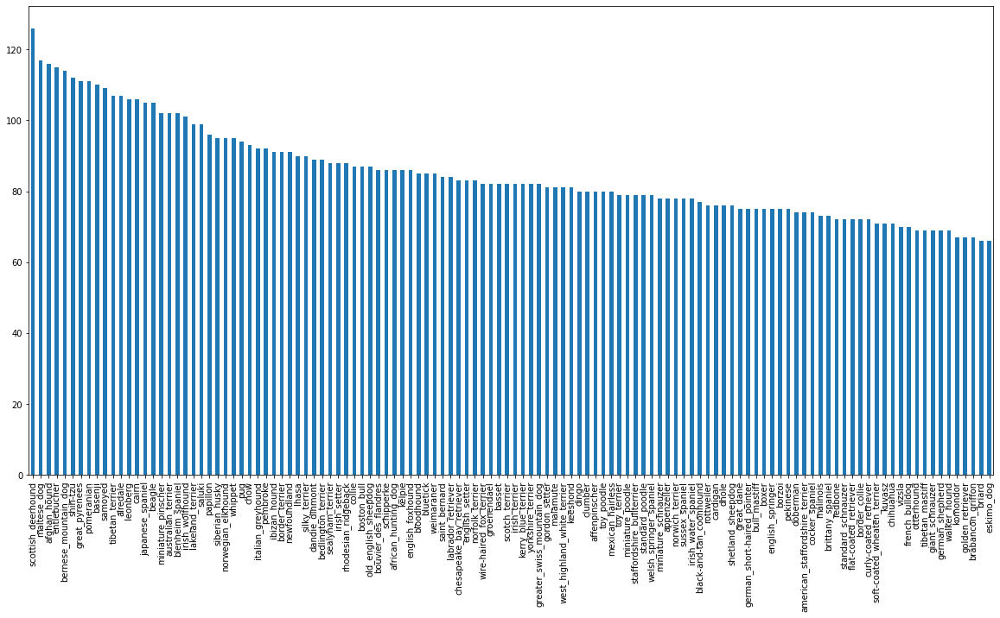

In [ ]:
# How many images are there for each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

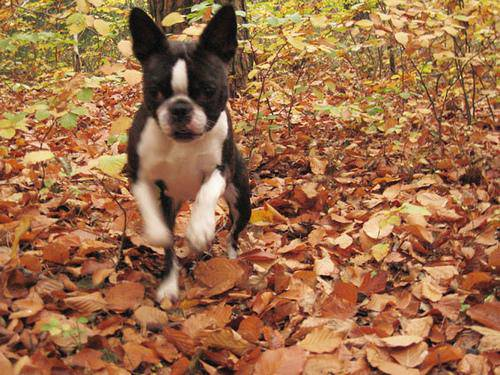

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

In [ ]:
filenames = ["/content/drive/MyDrive/dog-vision/train/" +fname for fname in labels_csv["id"]+".jpg"]

In [ ]:
filenames[:10]

['/content/drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# CHeck if number of filenames matches number of actual files
import os
if len(os.listdir("/content/drive/MyDrive/dog-vision/train/"))==len(filenames):
  print("Filenames match actual amount of files, proceed!")
else:
  print("Filenames do NOT match the actual amount of files, Check the train directory!")

Filenames match actual amount of files, proceed!


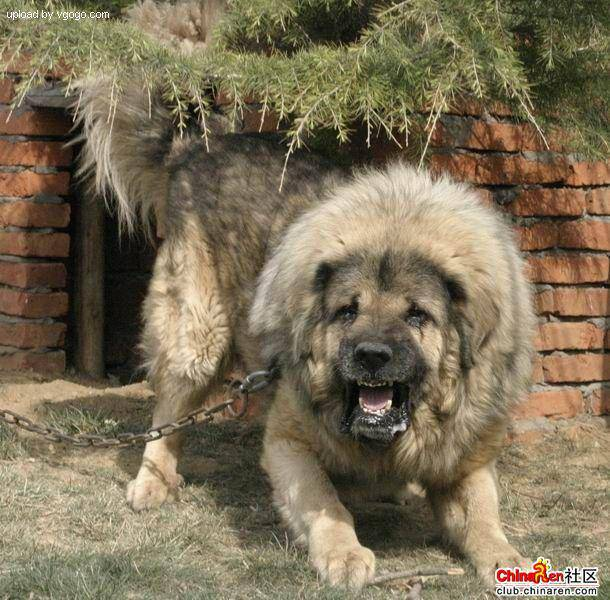

In [ ]:
Image(filenames[9000])

In [ ]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels 

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels)==len(filenames):
  print("OK")

OK


In [ ]:
unique_breeds=np.unique(labels)

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turning labels into booleans
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Turning into integers
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

In [ ]:
X = filenames

In [ ]:
y = boolean_labels

In [ ]:
# We're going to start with 1000 imagesand increase as needed.
NUM_IMAGES = 1000 #@param{type:"slider",min:1000,max:10000,step:100} 

In [ ]:
# Split data
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

## Preprocessing images (turning into tensors)

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to variable,'image'
3. Turn our 'image' into Tensors
4. Resize the image to be a shape of (224, 224)
5. Return the modified 'image' 

In [ ]:
IMG_SIZE=224
def process_image(image_path,img_size=IMG_SIZE):
  """
  Takes an image filepath and turns an image into Tensor
  """
  # Read an image file
  image=tf.io.read_file(image_path)
  # Turn the jpeg into numerical Tensor (RGB channels)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize
  image=tf.image.resize(image,size=[img_size,img_size])
  return image

## Turning our data into batches

(process 32 images (this is batch size!) in every loop)


In [ ]:
def get_image_label(image_path, label):
  """
  Processes the image and returns a typle of (image, label)
  """
  image=process_image(image_path)
  return image, label

Now we've got a way to turn our data into tuples of Tensors in form (image, label), let's make a function to turn all our data into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32 #@param {type:"slider", min:32, max:128, step:16}

In [ ]:
def create_data_batches(X, y=None,batch_size=BATCH_SIZE, valid_data=False, test_data= False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data
  Also accepts test data as input (no labels)
  """
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Create training data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    data=data.shuffle(buffer_size=len(X))
    data=data.map(get_image_label)
    data_batch=data.batch(batch_size)
    return data_batch

In [ ]:
#create training and validation data batches
train_data=create_data_batches  (X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Create training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Bathes

Our data now in bathes, however, this can be a little hard to understand, let's visualize it

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt. subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

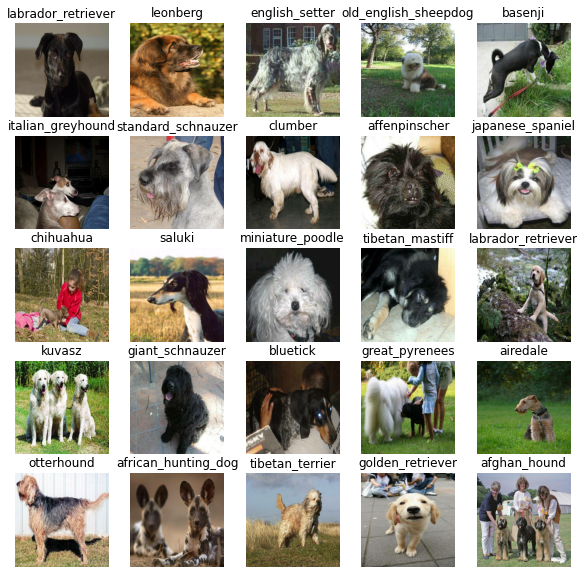

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

## Building a model
Before we build a model, there are a few things we need to define:
* The input shape to our model
* The output shapes of our model
* The URL of model we want to use

In [ ]:
# Setup input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width,color channels
# Setup output shape
OUTPUT_SHAPE= len(unique_breeds)
# Setup model URL from TensorFlow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs and outputs and model ready. 
Let's put them together into Keras deep learning model.

Let's create a function, whitch:
* Takes input shape, output shape and the model as parameters
* Defines the layers in a Keras model in sequential fashion
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model


In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", model_url)

  # Setup the model layers
  model=tf.keras.Sequential([hub.KerasLayer(model_url),
                             tf.keras.layers.Dense(units=output_shape,
                                                   activation="softmax")
                             ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # Build the model
  model.build(input_shape)
  return model

In [ ]:
model=create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training if a model stops improving

We'll create two callbacks:
one for TensorBoard to track our model progress
second for early stopping, which prevents our model from training for too long.

### TensorBoard Callback
1. load the tensorboard notebook extention
2. create a tensorboard callback which is able to save logs to directory and pass it to our model's 'fit()' function
3. visualize our model's training logs with the '%tensorboard' magic function (we'll do this after model training

In [ ]:
# Load TensorBoard notebook extention
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a tb callback
def create_tensorboard_callback():
  logdir=os.path.join("/content/drive/MyDrive/dog-vision/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)
  

In [ ]:
# Create early stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

## Training a model (on subset of data)


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}


Let's create a function which trains a model.
* create a model
* setup callback
* call the fit()
* return the model

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model=create_model()
  # Create a new tensorboard session every time we train a model
  tensorboard=create_tensorboard_callback()
  # Fit the model to data
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model
model=train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 118s 3s/step - loss: 4.6611 - accuracy: 0.0850 - val_loss: 3.5313 - val_accuracy: 0.2200
Epoch 2/100
25/25 [==============================] - 5s 183ms/step - loss: 1.6840 - accuracy: 0.6650 - val_loss: 2.2895 - val_accuracy: 0.4600
Epoch 3/100
25/25 [==============================] - 4s 178ms/step - loss: 0.5926 - accuracy: 0.9287 - val_loss: 1.7302 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 5s 181ms/step - loss: 0.2664 - accuracy: 0.9837 - val_loss: 1.5570 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 5s 181ms/step - loss: 0.1520 - accuracy: 0.9962 - val_loss: 1.4737 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 5s 184ms/step - loss: 0.1039 - accuracy: 1.0000 - val_loss: 1.4350 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================

### Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will access the logs directory and visualize it's contents

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/dog-vision/logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, 
                            verbose=1)
predictions

7/7 [==============================] - 3s 118ms/step


array([[1.3858051e-02, 5.8087542e-05, 4.8045648e-04, ..., 1.6335169e-03,
        4.0476454e-05, 1.7708229e-02],
       [1.2736565e-02, 6.9723529e-04, 1.4380330e-02, ..., 1.6111678e-03,
        4.3327822e-03, 5.0042360e-04],
       [1.2818907e-04, 7.8314054e-04, 5.1430485e-04, ..., 2.5420925e-03,
        2.3693958e-04, 6.0012128e-04],
       ...,
       [7.1511444e-05, 2.6859432e-05, 9.5291238e-04, ..., 4.8549024e-05,
        3.1638442e-04, 5.0780684e-05],
       [2.3094972e-03, 5.1341089e-04, 6.5082037e-05, ..., 4.7888909e-04,
        1.3358182e-04, 5.3885102e-02],
       [5.1502284e-04, 1.8362630e-04, 1.1615787e-03, ..., 1.9626748e-02,
        9.2279178e-04, 3.5750640e-05]], dtype=float32)

In [ ]:
# First prediction
index=42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.23319172e-04 3.68940644e-04 5.28931152e-04 1.08390443e-04
 1.08282324e-02 2.37476430e-04 3.19719809e-04 1.46767753e-03
 2.61664037e-02 2.96415202e-02 6.10552161e-05 2.90809185e-05
 3.04703804e-04 1.38409706e-02 1.28428568e-03 4.86754673e-03
 4.53461253e-05 7.50604595e-05 7.14923721e-04 1.45026529e-03
 5.72943463e-05 1.86467078e-04 6.07257316e-05 2.05298726e-04
 4.12641317e-02 5.57355343e-05 1.26307359e-05 8.96428755e-05
 1.03471568e-03 1.31568857e-04 2.74729628e-05 7.47266968e-05
 1.72962813e-04 6.03744666e-05 6.04762936e-05 1.97930713e-05
 3.46439134e-04 1.06583326e-03 1.79303795e-04 1.06034346e-01
 1.66971324e-04 1.99702390e-05 5.00730565e-03 2.45853953e-05
 5.53613994e-04 9.33626870e-05 2.34952735e-04 2.17754720e-03
 3.78765108e-05 2.23066556e-04 2.71353405e-04 3.29300019e-05
 2.36791893e-04 3.19850654e-03 2.31326121e-05 5.86554524e-04
 5.44505252e-04 2.23554249e-04 3.55748838e-04 1.14212780e-04
 2.02547686e-04 8.47808085e-04 2.06133773e-05 2.52296049e-05
 1.58980009e-04 2.179270

In [ ]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label= get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
def unbatchify(data):
  """
  Takes a batch dataset of (image, label) tensors and returns separate arrays of images and labels
  """
  images_ = []
  labels_ = []

  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

We'll create a function which:
* Takes an array of prediction probabilities, an arrat of truth labels and an array of images and integer.
* Converts the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([]) 
  # Change color of title depending on prediction is right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}% {}".format(pred_label, 
                                    np.max(pred_prob)*100,
                                    true_label),
            color = color)
  pass


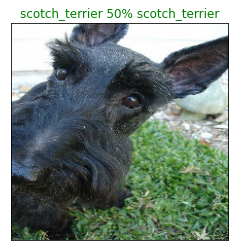

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images,n=1)

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), 
             labels=top_10_pred_labels, 
             rotation="vertical")
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass
    

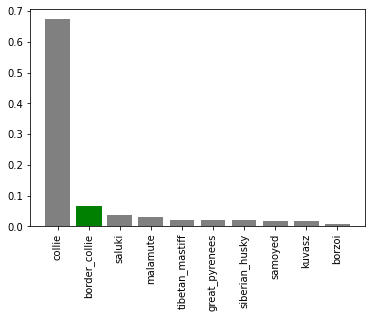

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to visualize our predictions and evaluate our model, let's check out a few.

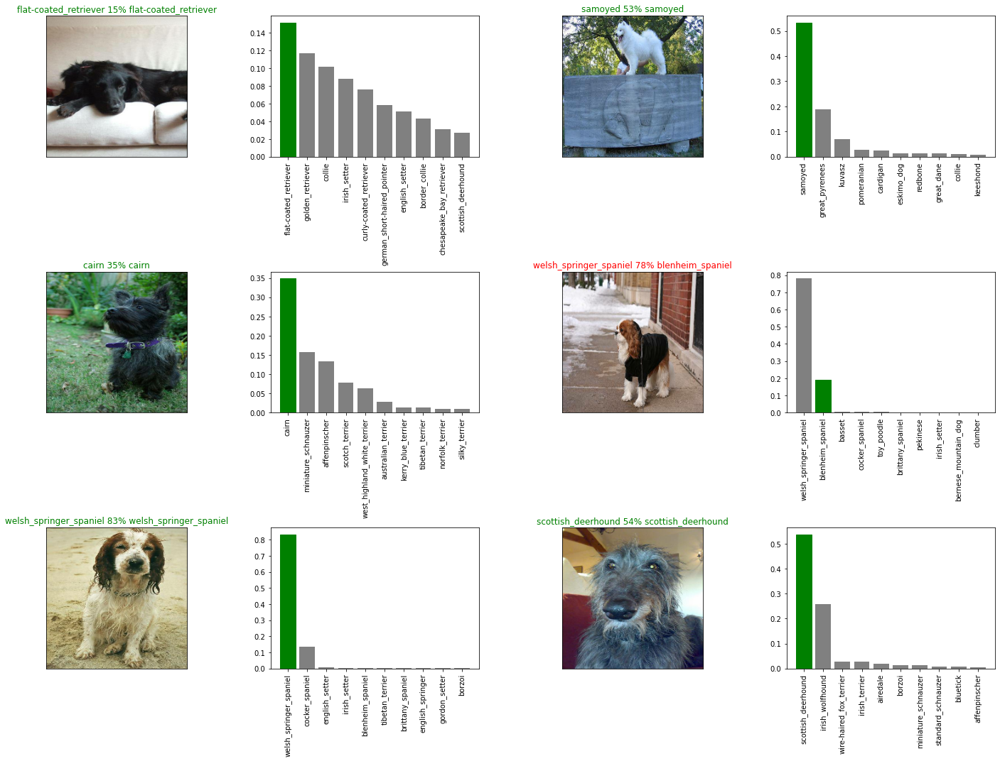

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Reloading a trained model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a string suffix.
  """
  model_dir = os.path.join("/content/drive/MyDrive/dog-vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=model_dir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
def load_model(model_path):
  """
  Loads a saved model from specified path
  """
  print(f"Loading a model from path: {model_path} ...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv3-Adam")

Saving model to: /content/drive/MyDrive/dog-vision/models/20211025-06311635143481-1000-images-mobilenetv3-Adam.h5...


'/content/drive/MyDrive/dog-vision/models/20211025-06311635143481-1000-images-mobilenetv3-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/dog-vision/models/20211025-06311635143481-1000-images-mobilenetv3-Adam.h5")

Loading a model from path: /content/drive/MyDrive/dog-vision/models/20211025-06311635143481-1000-images-mobilenetv3-Adam.h5 ...


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 117ms/step - loss: 1.3650 - accuracy: 0.6450


[1.3649629354476929, 0.6449999809265137]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 110ms/step - loss: 1.3650 - accuracy: 0.6450


[1.3649629354476929, 0.6449999809265137]

## Training a big dog model (on full data!)

In [ ]:
# Create a data batch with the full data set
full_data=create_data_batches(X,y)

Create training data batches...


In [ ]:
# Create a model for full model
full_model=create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor  validation accuracy
full_model_early_stopping= tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)

**Note:** Running the cell below will take ~30 min

In [ ]:
# Fit full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 830s 3s/step - loss: 1.3288 - accuracy: 0.6729
Epoch 2/100
320/320 [==============================] - 42s 131ms/step - loss: 0.3986 - accuracy: 0.8804
Epoch 3/100
320/320 [==============================] - 42s 131ms/step - loss: 0.2359 - accuracy: 0.9372
Epoch 4/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1568 - accuracy: 0.9631
Epoch 5/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1062 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0778 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0581 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0465 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0375 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 42s 130ms/

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

In [74]:
loaded_full_model=load_model("/content/drive/MyDrive/dog-vision/models/20211025-07281635146918-full-image-set-mobilenetv2-Adam.h5")

Loading a model from path: /content/drive/MyDrive/dog-vision/models/20211025-07281635146918-full-image-set-mobilenetv2-Adam.h5 ...


## Making predictions on test data set

In [76]:
test_path="/content/drive/MyDrive/dog-vision/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog-vision/test/e2b6d4957b62934bd831c3a1b65e2ebb.jpg',
 '/content/drive/MyDrive/dog-vision/test/e5b43e17eb88bc5e2d6e9d1d04c01a5a.jpg',
 '/content/drive/MyDrive/dog-vision/test/e008da6b957c62e7bcf6eb2ba4c2abd9.jpg',
 '/content/drive/MyDrive/dog-vision/test/e4b76574d24800b91bdcfc886fb74f23.jpg',
 '/content/drive/MyDrive/dog-vision/test/dfe25675d32a75ade0f2893cf2ab63a9.jpg',
 '/content/drive/MyDrive/dog-vision/test/e18c30f7ba3680d75ff326ccb71642e0.jpg',
 '/content/drive/MyDrive/dog-vision/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 '/content/drive/MyDrive/dog-vision/test/e3f04efb648b110b2eb04b9c041504d8.jpg',
 '/content/drive/MyDrive/dog-vision/test/df4b040b13c5f514d215ba7c0813eaf8.jpg',
 '/content/drive/MyDrive/dog-vision/test/e3dd8fc9162f726122ca4cc783114c81.jpg']

In [77]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


**Note:** Running the cell below takes time!

In [78]:
# Make predictions on test data
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 944s 3s/step


In [79]:
np.savetxt("/content/drive/MyDrive/dog-vision/preds_array.csv", test_predictions, delimiter=",")

## Preparing test dataset predictions for Kaggle

We'll going to:
* Create a pandas DataFrame with an ID and column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filenames
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame to csv

In [80]:
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [82]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [84]:
preds_df["id"]=test_ids

In [85]:
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2b6d4957b62934bd831c3a1b65e2ebb,4.64023e-13,3.2898e-10,1.86995e-12,5.61087e-11,1.95367e-12,1.46596e-13,3.34262e-17,2.67963e-13,3.90728e-13,2.42772e-15,1.54144e-12,6.07721e-13,9.97095e-13,6.58698e-12,3.12098e-13,4.96632e-14,4.65137e-15,8.34291e-12,1.08163e-14,8.3476e-17,1.57802e-07,6.96352e-12,4.80713e-11,2.37081e-08,1.99721e-15,3.14308e-09,8.27446e-12,2.42679e-15,3.16709e-12,4.88776e-17,2.19099e-12,4.87362e-13,5.67946e-10,1.89483e-14,6.66068e-14,9.2422e-11,5.9202e-14,8.5257e-11,6.40793e-14,...,6.82165e-15,3.78591e-15,9.5819e-12,3.4405e-12,2.22868e-13,1.05458e-13,2.0297e-13,7.23826e-12,9.62059e-12,8.33534e-14,4.00541e-11,4.73958e-12,1.07748e-11,1.28013e-13,2.27418e-15,4.41046e-14,1.10092e-13,4.55365e-15,8.50289e-11,1.55633e-14,7.27219e-09,1.39352e-12,1.92511e-12,1,3.17715e-13,2.93567e-12,1.0436e-09,5.21766e-15,9.53576e-11,3.28088e-11,4.67676e-11,7.16306e-15,1.02467e-15,2.99648e-15,4.12651e-13,4.17336e-14,1.86365e-15,4.36812e-12,2.71578e-13,2.59549e-11
1,e5b43e17eb88bc5e2d6e9d1d04c01a5a,1.99771e-12,6.10053e-14,2.35252e-10,2.30325e-14,1.00507e-12,6.898e-13,1.09835e-13,1.14096e-10,1.44211e-14,1.87116e-12,4.98391e-12,2.02059e-14,1.3769e-12,1.69625e-14,2.64733e-13,1.77158e-12,4.87364e-12,1.08109e-09,1.09418e-13,1.96978e-13,1.56235e-11,6.68952e-13,1.06385e-12,3.16429e-13,1.82927e-14,2.50544e-15,1.07428e-07,2.32688e-10,2.47751e-10,1.3396e-10,5.54746e-12,2.57555e-15,1.64651e-15,2.69328e-12,2.5403e-12,8.21852e-13,1.87687e-10,6.81843e-11,2.22894e-12,...,0.999996,1.27965e-13,1.59204e-13,1.30976e-16,7.1011e-12,4.49963e-12,2.23908e-13,7.13907e-12,2.42833e-08,1.0085e-09,3.09516e-12,2.09591e-13,5.5799e-14,3.42298e-14,1.81131e-13,2.85216e-09,4.53645e-10,3.60187e-12,7.61766e-13,3.84954e-17,1.71409e-11,6.89066e-10,7.56064e-12,6.63495e-13,6.92663e-10,6.25372e-10,9.11781e-11,3.32392e-14,9.03483e-13,4.79e-12,3.25938e-14,1.75676e-11,5.75166e-14,3.96158e-13,1.28152e-12,4.44853e-14,8.1227e-13,2.32851e-10,3.62741e-14,1.40612e-14
2,e008da6b957c62e7bcf6eb2ba4c2abd9,3.1955e-08,6.31334e-11,2.30243e-08,7.49076e-11,2.04548e-07,2.15315e-10,1.14789e-11,1.85175e-08,2.81742e-09,2.38236e-09,7.81009e-08,8.60003e-10,4.31962e-10,1.48801e-08,1.07559e-10,1.24782e-09,8.36964e-09,4.4269e-09,3.61005e-08,1.59741e-09,9.44879e-11,3.31386e-08,6.33889e-08,3.05793e-09,8.82519e-10,1.2122e-10,0.00032358,2.13694e-07,5.95038e-11,1.83213e-08,1.46302e-09,1.03937e-08,3.25296e-08,1.16097e-10,2.71784e-11,2.77042e-06,2.77274e-10,9.86832e-08,1.24627e-09,...,1.4937e-08,1.13877e-06,2.09025e-09,2.49186e-11,3.29349e-09,2.96687e-10,8.38721e-10,7.89754e-09,9.32782e-10,5.71814e-12,1.8289e-08,1.35068e-11,1.47372e-11,1.6085e-12,1.21219e-08,4.61818e-08,0.000154703,3.74296e-08,4.77733e-06,6.62087e-13,5.98796e-09,1.64295e-08,1.42666e-07,1.77535e-05,1.60341e-06,4.66493e-10,8.31921e-08,6.85066e-10,3.9499e-12,2.87127e-08,2.3418e-08,3.73693e-07,9.34281e-11,7.04384e-09,6.24623e-12,5.28063e-09,0.994748,7.09789e-08,

In [86]:
preds_df.to_csv("/content/drive/MyDrive/dog-vision/full_model_predictions_submisiion_1_mobilenetv2.csv", index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths
* Turn to data batches using 'create_data_batches()', test_data=True
* Pass the custom image data to predict() function of our model
* Convert the output probabilities to prediction labels
* Compare the prediction labels to the custom image

In [87]:
custom_path="/content/drive/MyDrive/dog-vision/custom/"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]

In [88]:
custom_image_paths

['/content/drive/MyDrive/dog-vision/custom/FCgBFsLWQAYN48B.jpg']

In [89]:
custom_data=create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [90]:
custom_preds=loaded_full_model.predict(custom_data)

In [91]:
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever']

In [92]:
custom_images=[]
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

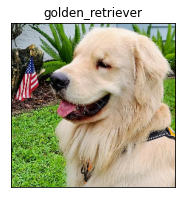

In [94]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
